In [1]:
###Importing necessary Libraries

import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
from datetime import datetime
import calendar
import folium
from folium import FeatureGroup, LayerControl, Map, Marker
from folium.plugins import HeatMap
from folium.plugins import TimestampedGeoJson
from folium.plugins import MarkerCluster
from geopy.distance import great_circle
import matplotlib.dates as mdates
import matplotlib as mpl
from datetime import timedelta
import datetime as dt
warnings.filterwarnings('ignore')
pd.set_option('display.max_colwidth', -1)
plt.style.use('fivethirtyeight')
import folium
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from geopy.distance import geodesic
from haversine import haversine

In [2]:
#Setting the working directory
os.chdir("F:/DS/Project 2")

In [3]:
#Display current working directory
os.getcwd()

'F:\\DS\\Project 2'

In [4]:
#removing impurities after manual observations such as improper date and lat long format 
fare=pd.read_csv("train_cab.csv", skiprows= [1182,1328,1124])
print(fare.dtypes)


fare_amount          float64
pickup_datetime      object 
pickup_longitude     float64
pickup_latitude      float64
dropoff_longitude    float64
dropoff_latitude     float64
passenger_count      float64
dtype: object


In [5]:
#Read the test data

fare_test=pd.read_csv("test.csv")
print(fare_test.dtypes)

pickup_datetime      object 
pickup_longitude     float64
pickup_latitude      float64
dropoff_longitude    float64
dropoff_latitude     float64
passenger_count      int64  
dtype: object


In [6]:
#####Type conversion
fare['pickup_datetime']=pd.to_datetime(fare['pickup_datetime'],format='%Y-%m-%d %H:%M:%S UTC')


#####Type conversion
fare_test['pickup_datetime']=pd.to_datetime(fare_test['pickup_datetime'],format='%Y-%m-%d %H:%M:%S UTC')


In [7]:
fare_test.head()

,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2015-01-27 13:08:24,-73.973320,40.763805,-73.981430,40.743835,1
1,2015-01-27 13:08:24,-73.986862,40.719383,-73.998886,40.739201,1
2,2011-10-08 11:53:44,-73.982524,40.751260,-73.979654,40.746139,1
3,2012-12-01 21:12:12,-73.981160,40.767807,-73.990448,40.751635,1
4,2012-12-01 21:12:12,-73.966046,40.789775,-73.988565,40.744427,1


In [8]:
####Missing value Analysis
missing_val=pd.DataFrame(fare.isnull().sum())
missing_val=(missing_val/len(fare))*100
missing_val.columns=['Percentage']
missing_val=missing_val.reset_index()
#missing_val
missing_val=missing_val.rename(columns={'index':'Variables',})
missing_val


,Variables,Percentage
0,fare_amount,0.149402
1,pickup_datetime,0.000000
2,pickup_longitude,0.000000
3,pickup_latitude,0.000000
4,dropoff_longitude,0.000000
5,dropoff_latitude,0.000000
6,passenger_count,0.342380


In [9]:
#We decide to drop such incorrect observations
fare=fare.dropna()

In [10]:
#Summarise the dataframe to get a brief idea
fare.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,15985.000000,15985.000000,15985.000000,15985.000000,15985.000000,15985.000000
mean,15.029829,-72.468885,39.918072,-72.468444,39.901166,2.623311
std,431.227426,10.558379,6.821952,10.555028,6.178521,60.894045
min,-3.000000,-74.438233,-74.006893,-74.429332,-74.006377,0.000000
25%,6.000000,-73.992145,40.734935,-73.991182,40.734659,1.000000
50%,8.500000,-73.981693,40.752603,-73.980168,40.753557,1.000000
75%,12.500000,-73.966824,40.767353,-73.963646,40.768005,2.000000
max,54343.000000,40.766125,401.083332,40.802437,41.366138,5345.000000


In [11]:
fare_test.describe()

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,9914.000000,9914.000000,9914.000000,9914.000000,9914.000000
mean,-73.974722,40.751041,-73.973657,40.751743,1.671273
std,0.042774,0.033541,0.039072,0.035435,1.278747
min,-74.252193,40.573143,-74.263242,40.568973,1.000000
25%,-73.992501,40.736125,-73.991247,40.735254,1.000000
50%,-73.982326,40.753051,-73.980015,40.754065,1.000000
75%,-73.968013,40.767113,-73.964059,40.768757,2.000000
max,-72.986532,41.709555,-72.990963,41.696683,6.000000


In [12]:
print("Range of Pickup Latitude is ", (min(fare['pickup_latitude']), max(fare['pickup_latitude'])))
print("Range of Pickup Longitude is ", (min(fare['pickup_longitude']), max(fare['pickup_longitude'])))
print("Range of Dropoff Latitude is ", (min(fare['dropoff_latitude']), max(fare['dropoff_latitude'])))
print("Range of Dropoff Longitude is ", (min(fare['dropoff_longitude']), max(fare['dropoff_longitude'])))

Range of Pickup Latitude is  (-74.006893, 401.083332)
Range of Pickup Longitude is  (-74.438233, 40.766125)
Range of Dropoff Latitude is  (-74.006377, 41.366138)
Range of Dropoff Longitude is  (-74.42933199999999, 40.802437)


#Outlier Analysis

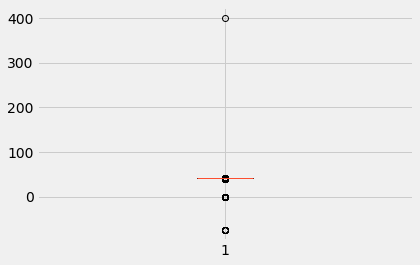

40.686308
40.815979999999996


In [13]:
#Lattitude----(-90 to 90)
#Longitude----(-180 to 180)

# #Plot boxplot to visualize Outliers
# %matplotlib inline  
plt.boxplot(fare['pickup_latitude'])
plt.show()

# #Detect and delete outliers from data
q75, q25 = np.percentile(fare.loc[:,'pickup_latitude'], [75 ,25])
iqr = q75 - q25

min = q25 - (iqr*1.5)
max = q75 + (iqr*1.5)
print(min)
print(max)
    
fare = fare.drop(fare[fare.loc[:,'pickup_latitude'] < min].index)
fare = fare.drop(fare[fare.loc[:,'pickup_latitude'] > max].index)


In [14]:
len(fare)

15199

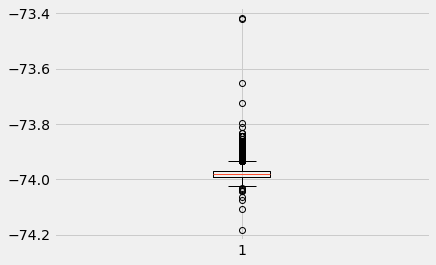

-74.02726625000003
-73.93470424999998


In [15]:
# #Plot boxplot to visualize Outliers
# %matplotlib inline  
plt.boxplot(fare['pickup_longitude'])
plt.show()

# #Detect and delete outliers from data
q75, q25 = np.percentile(fare.loc[:,'pickup_longitude'], [75 ,25])
iqr = q75 - q25

min = q25 - (iqr*1.5)
max = q75 + (iqr*1.5)
print(min)
print(max)
    

fare = fare.drop(fare[fare.loc[:,'pickup_longitude'] < min].index)
fare = fare.drop(fare[fare.loc[:,'pickup_longitude'] > max].index)

In [16]:
len(fare)

14672

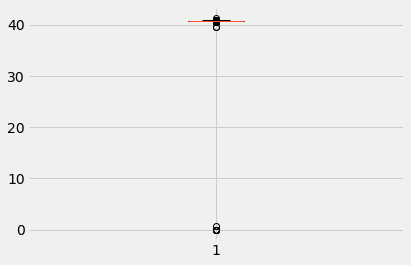

40.69009767875001
40.81539786875


In [17]:
# #Plot boxplot to visualize Outliers
# %matplotlib inline  
plt.boxplot(fare['dropoff_latitude'])
plt.show()

# #Detect and delete outliers from data
q75, q25 = np.percentile(fare.loc[:,'dropoff_latitude'], [75 ,25])
iqr = q75 - q25

min = q25 - (iqr*1.5)
max = q75 + (iqr*1.5)
print(min)
print(max)
    

fare = fare.drop(fare[fare.loc[:,'dropoff_latitude'] < min].index)
fare = fare.drop(fare[fare.loc[:,'dropoff_latitude'] > max].index)

In [18]:
len(fare)

14077

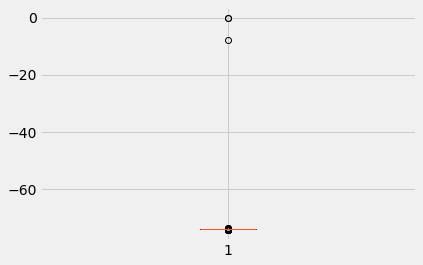

-74.026928
-73.933312


In [19]:
# #Plot boxplot to visualize Outliers
# %matplotlib inline  
plt.boxplot(fare['dropoff_longitude'])
plt.show()

# #Detect and delete outliers from data
q75, q25 = np.percentile(fare.loc[:,'dropoff_longitude'], [75 ,25])
iqr = q75 - q25

min = q25 - (iqr*1.5)
max = q75 + (iqr*1.5)
print(min)
print(max)
fare = fare.drop(fare[fare.loc[:,'dropoff_longitude'] < min].index)
fare = fare.drop(fare[fare.loc[:,'dropoff_longitude'] > max].index)   



In [20]:
len(fare)

13597

In [21]:
fare[(fare.pickup_latitude==0) | (fare.pickup_longitude)==0 | (fare.dropoff_latitude==0)|(fare.dropoff_longitude==0)].shape

(0, 7)

In [22]:
drop_map = folium.Map([40.730610,-73.935242],zoom_start = 12)


#print(pickup.shape)
### For each pickup point add a circlemarker

for index, row in fare.iterrows():
    
    folium.CircleMarker([row['dropoff_latitude'], row['dropoff_longitude']],
                        radius=3,
                        
                        color="#008000", 
                        fill_opacity=0.9
                       ).add_to(drop_map)
for index, row in fare.iterrows():
    
    folium.CircleMarker([row['pickup_latitude'], row['pickup_longitude']],
                        radius=3,
                        
                        color="blue", 
                        fill_opacity=0.9
                       ).add_to(drop_map)
    
drop_map

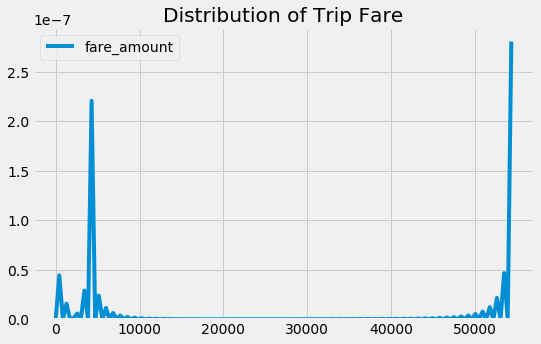

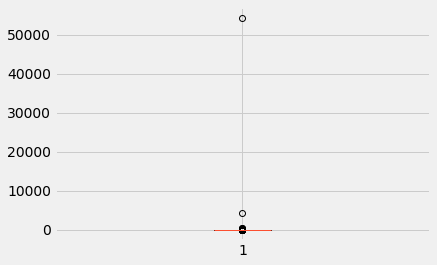

-2.1000000000000005
18.700000000000003
543


In [23]:
###outliers

#Find the distribution of target variable
plt.figure(figsize=(8,5))
sns.kdeplot(fare['fare_amount']).set_title("Distribution of Trip Fare")
plt.show()

# #Plot boxplot to visualize Outliers
# %matplotlib inline  
plt.boxplot(fare['fare_amount'])
plt.show()

# #Detect and delete outliers from data
q75, q25 = np.percentile(fare.loc[:,'fare_amount'], [75 ,25])
iqr = q75 - q25

min = q25 - (iqr*1.5)
max = q75 + (iqr*1.5)
print(min)
print(max)
    
sum=(fare.loc[:,'fare_amount'] <= 0).sum() + (fare.loc[:,'fare_amount'] > max).sum()
print(sum)


# Fare amount can't be 0 or less than 0 hence the minimum value
fare = fare.drop(fare[fare.loc[:,'fare_amount'] <= 0].index)
fare = fare.drop(fare[fare.loc[:,'fare_amount'] > max].index)

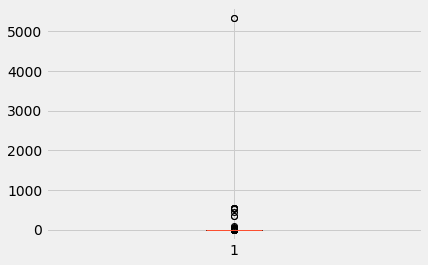

In [24]:
# #Plot boxplot to visualize Outliers
# %matplotlib inline  
plt.boxplot(fare['passenger_count'])
plt.show()


fare['passenger_count'].value_counts()

#From the test set and boxplot, it is implied that the range of passenger count is within 1-6
fare = fare.drop(fare[fare.loc[:,'passenger_count'] < 1].index)
fare = fare.drop(fare[fare.loc[:,'passenger_count'] > 6].index)

In [25]:
###Feature Extraction
#Feature Extraction from existing available variables
fare['dist']=0

for i in range(0,len(fare)):
    fare['dist'].iloc[i]=haversine((fare['pickup_latitude'].iloc[i],fare['pickup_longitude'].iloc[i]),
                                  (fare['dropoff_latitude'].iloc[i],fare['dropoff_longitude'].iloc[i])
                                ) 
        
print("column inserted")
###Distance in KM

column inserted


In [26]:
####Extract features for test data as well
fare_test['dist']=0

for i in range(0,len(fare_test)):
    fare_test['dist'].iloc[i]=haversine((fare_test['pickup_latitude'].iloc[i],fare_test['pickup_longitude'].iloc[i]),
                                  (fare_test['dropoff_latitude'].iloc[i],fare_test['dropoff_longitude'].iloc[i])
                                )
print("column inserted")
###Distance in KM

column inserted


In [27]:
fare.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dist
count,12988.000000,12988.000000,12988.000000,12988.000000,12988.000000,12988.000000,12988.000000
mean,8.339666,-73.981776,40.752936,-73.980939,40.753415,1.647213,2.252841
std,3.453875,0.015966,0.021425,0.016459,0.022141,1.265408,1.488920
min,0.010000,-74.018108,40.686538,-74.019535,40.690125,1.000000,0.000000
25%,5.700000,-73.992761,40.738551,-73.991979,40.739038,1.000000,1.165012
50%,7.700000,-73.982643,40.753553,-73.982044,40.754606,1.000000,1.877787
75%,10.500000,-73.971351,40.766866,-73.970702,40.767401,2.000000,2.978875
max,18.500000,-73.935007,40.815825,-73.933333,40.815357,6.000000,10.631679


In [28]:
##Need to lat and long where distance covered is 0

In [29]:
###Distance can't be 0 so removing the incorrect observations
fare = fare[(fare['pickup_latitude'] != fare['dropoff_latitude']) & (fare['pickup_longitude'] != fare['dropoff_longitude'])]

In [30]:
len(fare)

12874

In [31]:
#Removed all observations with 0 distance
fare.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dist
count,12874.000000,12874.000000,12874.000000,12874.000000,12874.000000,12874.000000,12874.000000
mean,8.353517,-73.981790,40.752959,-73.980946,40.753442,1.648672,2.272620
std,3.452793,0.015946,0.021415,0.016446,0.022136,1.266726,1.480471
min,0.010000,-74.018108,40.686538,-74.019535,40.690125,1.000000,0.000202
25%,5.700000,-73.992763,40.738553,-73.991973,40.739061,1.000000,1.184311
50%,7.700000,-73.982641,40.753563,-73.982029,40.754633,1.000000,1.893020
75%,10.500000,-73.971368,40.766879,-73.970764,40.767438,2.000000,2.991846
max,18.500000,-73.935007,40.815825,-73.933333,40.815357,6.000000,10.631679


In [32]:
#####Features

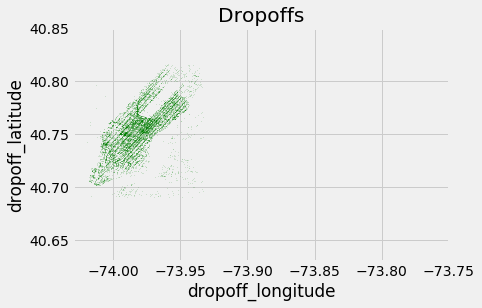

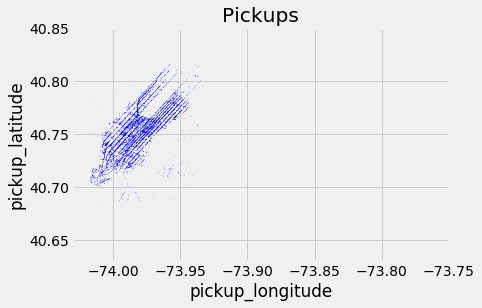

In [33]:
#Plots
city_long_border = (-74.03, -73.75)
city_lat_border = (40.63, 40.85)

#Scatter plot of Dropoffs
fare.plot(kind='scatter', x='dropoff_longitude', y='dropoff_latitude',
                color='green', 
                s=.02, alpha=0.6)
plt.title("Dropoffs")

plt.ylim(city_lat_border)
plt.xlim(city_long_border)
plt.show()

#Scatter plot of Pickups 
fare.plot(kind='scatter', x='pickup_longitude', y='pickup_latitude',
                color='blue', 
                s=.02, alpha=.6)
plt.title("Pickups")

plt.ylim(city_lat_border)
plt.xlim(city_long_border)
plt.show()

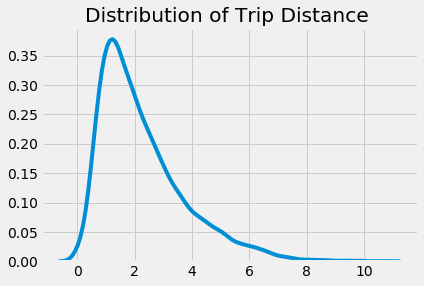

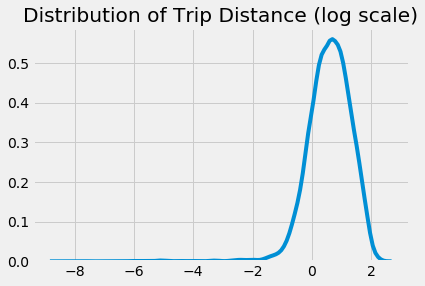

In [34]:
#Plotting the distribution of Distance covered
sns.kdeplot((fare['dist'].values)).set_title("Distribution of Trip Distance ")
plt.show()
sns.kdeplot(np.log(fare['dist'].values)).set_title("Distribution of Trip Distance (log scale)")
plt.show()

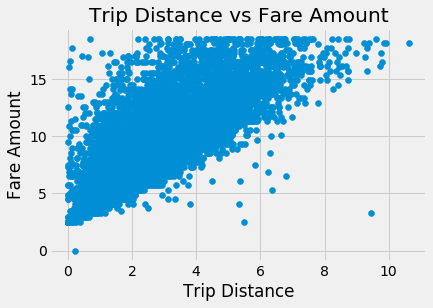

In [35]:
#Plot of Distance VS Fare
plt.scatter(x=fare['dist'],y=fare['fare_amount'])
plt.xlabel("Trip Distance")
plt.ylabel("Fare Amount")
plt.title("Trip Distance vs Fare Amount")
plt.show()

In [36]:
####Feature Extraction from Datetime variable
def late_night (row):
    if (row['pickup_hour'] <= 6) or (row['pickup_hour'] >= 20):
        return 1
    else:
        return 0
    
def encodeDays(day_of_week):
    day_dict={'Sunday':7,'Monday':1,'Tuesday':2,'Wednesday':3,'Thursday':4,'Friday':5,'Saturday':6}
    return day_dict[day_of_week]
    
fare['pickup_day']=fare['pickup_datetime'].apply(lambda x:x.day)
fare['pickup_hour']=fare['pickup_datetime'].apply(lambda x:x.hour)
fare['pickup_month']=fare['pickup_datetime'].apply(lambda x:x.month)
fare['pickup_year']=fare['pickup_datetime'].apply(lambda x:x.year)
fare['pickup_day_of_week']=fare['pickup_datetime'].apply(lambda x:calendar.day_name[x.weekday()])
fare['pickup_day_of_week']=fare['pickup_day_of_week'].apply(lambda x:encodeDays(x))
fare['late_night'] = fare.apply (lambda x: late_night(x), axis=1)
fare['passenger_count']=fare['passenger_count'].astype('int64')





In [37]:
###Extract features for test data
fare_test['pickup_day']=fare_test['pickup_datetime'].apply(lambda x:x.day)
fare_test['pickup_hour']=fare_test['pickup_datetime'].apply(lambda x:x.hour)
fare_test['pickup_month']=fare_test['pickup_datetime'].apply(lambda x:x.month)
fare_test['pickup_year']=fare_test['pickup_datetime'].apply(lambda x:x.year)
fare_test['pickup_day_of_week']=fare_test['pickup_datetime'].apply(lambda x:calendar.day_name[x.weekday()])
fare_test['pickup_day_of_week']=fare_test['pickup_day_of_week'].apply(lambda x:encodeDays(x))
fare_test['late_night'] = fare_test.apply (lambda x: late_night(x), axis=1)
fare_test['passenger_count']=fare_test['passenger_count'].astype('int64')

In [38]:
fare.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12874 entries, 1 to 16062
Data columns (total 14 columns):
fare_amount           12874 non-null float64
pickup_datetime       12874 non-null datetime64[ns]
pickup_longitude      12874 non-null float64
pickup_latitude       12874 non-null float64
dropoff_longitude     12874 non-null float64
dropoff_latitude      12874 non-null float64
passenger_count       12874 non-null int64
dist                  12874 non-null float64
pickup_day            12874 non-null int64
pickup_hour           12874 non-null int64
pickup_month          12874 non-null int64
pickup_year           12874 non-null int64
pickup_day_of_week    12874 non-null int64
late_night            12874 non-null int64
dtypes: datetime64[ns](1), float64(6), int64(7)
memory usage: 2.1 MB


In [39]:
###Feature Distribution against Target variable

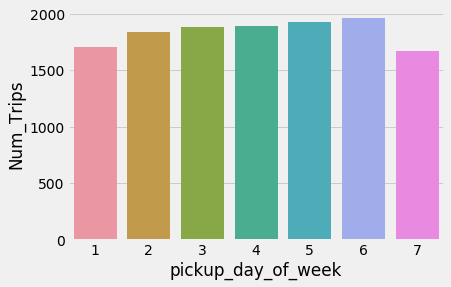

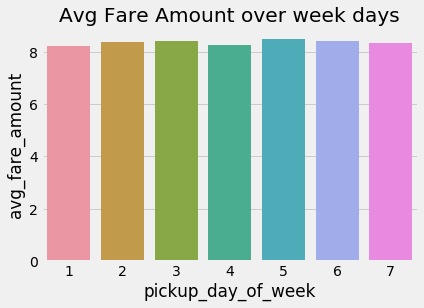

In [40]:
#pickup_day_of_week
trips_weekday=pd.DataFrame(fare['pickup_day_of_week'].value_counts())
trips_weekday=trips_weekday.reset_index()
trips_weekday=trips_weekday.rename(columns={'index':'pickup_day_of_week','pickup_day_of_week':'Num_Trips'})


sns.barplot(x='pickup_day_of_week',y='Num_Trips',data=trips_weekday)
plt.show()


trips_weekday_fareamount=fare.groupby(['pickup_day_of_week'])['fare_amount'].mean().reset_index().rename(columns={'fare_amount':'avg_fare_amount'})
sns.barplot(x='pickup_day_of_week',y='avg_fare_amount',data=trips_weekday_fareamount).set_title("Avg Fare Amount over week days")
plt.show()

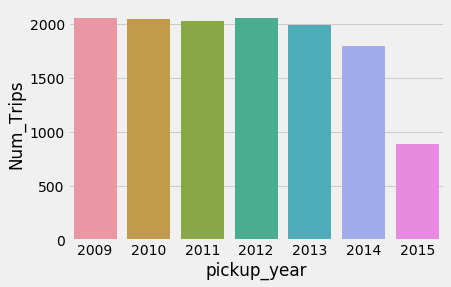

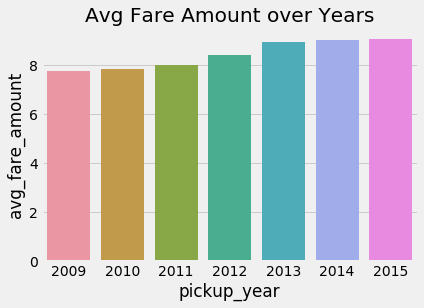

In [41]:
#pickup_year
trips_year=pd.DataFrame(fare['pickup_year'].value_counts())
trips_year=trips_year.reset_index()
trips_year=trips_year.rename(columns={'index':'pickup_year','pickup_year':'Num_Trips'})


trips_year.head()
sns.barplot(x='pickup_year',y='Num_Trips',data=trips_year)
plt.show()


trips_year_fareamount=fare.groupby(['pickup_year'])['fare_amount'].mean().reset_index().rename(columns={'fare_amount':'avg_fare_amount'})
sns.barplot(x='pickup_year',y='avg_fare_amount',data=trips_year_fareamount).set_title("Avg Fare Amount over Years")
plt.show()

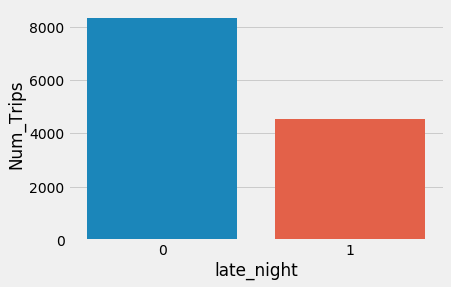

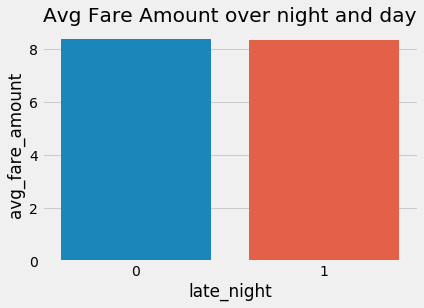

In [42]:
#late_night
trips_night=pd.DataFrame(fare['late_night'].value_counts())
trips_night=trips_night.reset_index()
trips_night=trips_night.rename(columns={'index':'late_night','late_night':'Num_Trips'})


sns.barplot(x='late_night',y='Num_Trips',data=trips_night)
plt.show()


trips_night_fareamount=fare.groupby(['late_night'])['fare_amount'].mean().reset_index().rename(columns={'fare_amount':'avg_fare_amount'})
sns.barplot(x='late_night',y='avg_fare_amount',data=trips_night_fareamount).set_title("Avg Fare Amount over night and day")
plt.show()

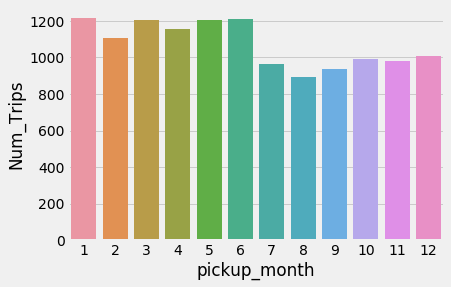

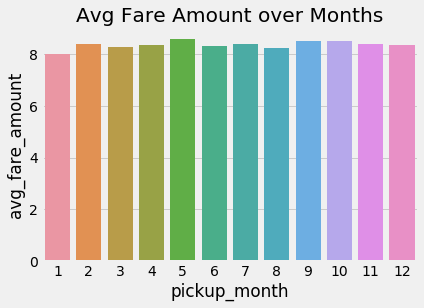

In [43]:
#pickup_month
trips_month=pd.DataFrame(fare['pickup_month'].value_counts())
trips_month=trips_month.reset_index()
trips_month=trips_month.rename(columns={'index':'pickup_month','pickup_month':'Num_Trips'})


sns.barplot(x='pickup_month',y='Num_Trips',data=trips_month)
plt.show()

trips_month_fareamount=fare.groupby(['pickup_month'])['fare_amount'].mean().reset_index().rename(columns={'fare_amount':'avg_fare_amount'})
sns.barplot(x='pickup_month',y='avg_fare_amount',data=trips_month_fareamount).set_title("Avg Fare Amount over Months")
plt.show()

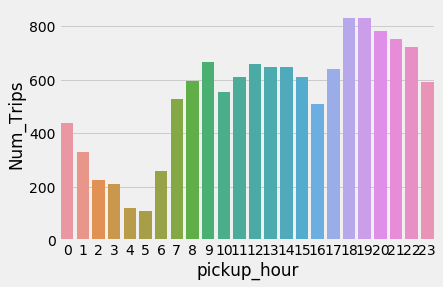

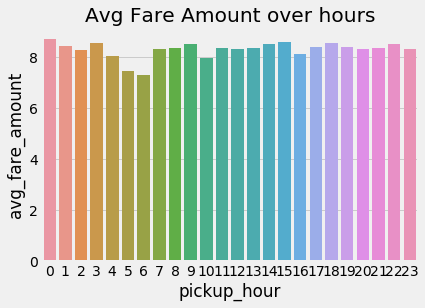

In [44]:
#pickup_hour
trips_hour=pd.DataFrame(fare['pickup_hour'].value_counts())
trips_hour=trips_hour.reset_index()
trips_hour=trips_hour.rename(columns={'index':'pickup_hour','pickup_hour':'Num_Trips'})


sns.barplot(x='pickup_hour',y='Num_Trips',data=trips_hour)
plt.show()

trips_hour_fareamount=fare.groupby(['pickup_hour'])['fare_amount'].mean().reset_index().rename(columns={'fare_amount':'avg_fare_amount'})
sns.barplot(x='pickup_hour',y='avg_fare_amount',data=trips_hour_fareamount).set_title("Avg Fare Amount over hours")
plt.show()

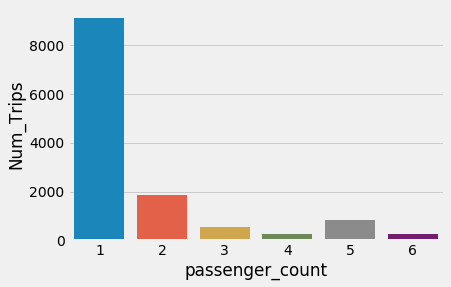

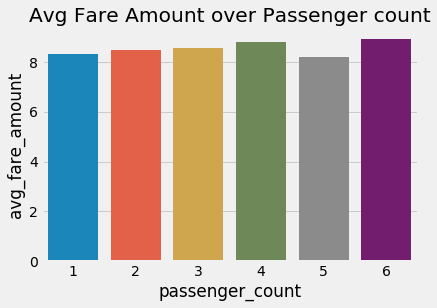

In [45]:
#passenger_count
pass_count=pd.DataFrame(fare['passenger_count'].value_counts())
pass_count=pass_count.reset_index()
pass_count=pass_count.rename(columns={'index':'passenger_count','passenger_count':'Num_Trips'})


sns.barplot(x='passenger_count',y='Num_Trips',data=pass_count)
plt.show()


pass_count_fareamount=fare.groupby(['passenger_count'])['fare_amount'].mean().reset_index().rename(columns={'fare_amount':'avg_fare_amount'})
sns.barplot(x='passenger_count',y='avg_fare_amount',data=pass_count_fareamount).set_title("Avg Fare Amount over Passenger count")
plt.show()

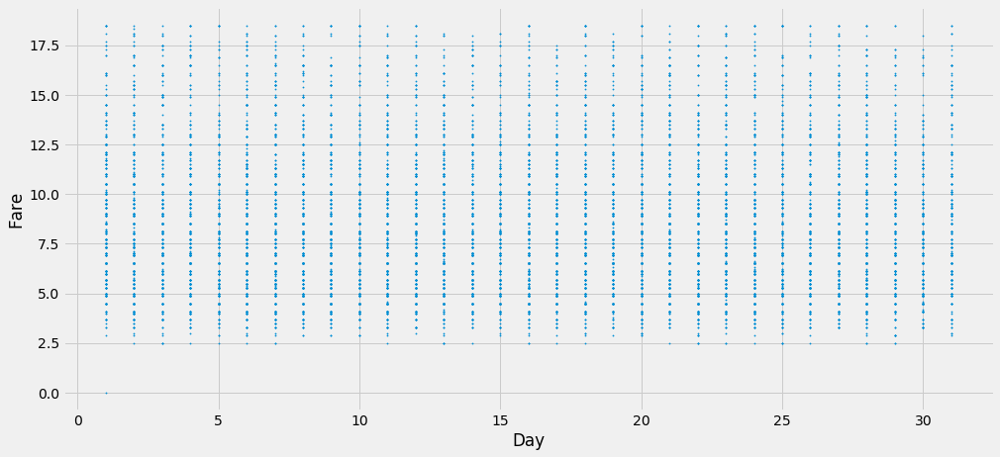

In [46]:
##pickup_day
plt.figure(figsize=(15,7))
plt.scatter(x=fare['pickup_day'], y=fare['fare_amount'], s=1.5)
plt.xlabel('Day')
plt.ylabel('Fare')
plt.show()

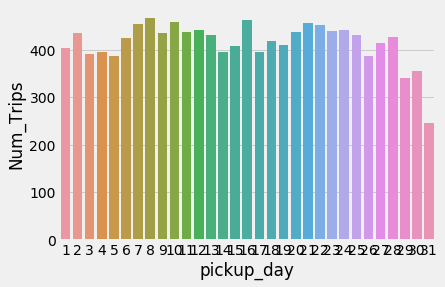

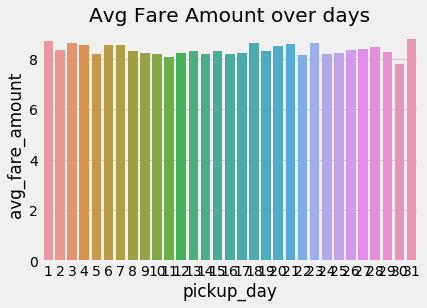

In [47]:
##pickup_day
trips_day=pd.DataFrame(fare['pickup_day'].value_counts())
trips_day=trips_day.reset_index()
trips_day=trips_day.rename(columns={'index':'pickup_day','pickup_day':'Num_Trips'})


sns.barplot(x='pickup_day',y='Num_Trips',data=trips_day)
plt.show()

trips_day_fareamount=fare.groupby(['pickup_day'])['fare_amount'].mean().reset_index().rename(columns={'fare_amount':'avg_fare_amount'})
sns.barplot(x='pickup_day',y='avg_fare_amount',data=trips_day_fareamount).set_title("Avg Fare Amount over days")
plt.show()

In [48]:
#fared=fare

In [49]:
#fare=fared

In [50]:
fare.dtypes

fare_amount           float64       
pickup_datetime       datetime64[ns]
pickup_longitude      float64       
pickup_latitude       float64       
dropoff_longitude     float64       
dropoff_latitude      float64       
passenger_count       int64         
dist                  float64       
pickup_day            int64         
pickup_hour           int64         
pickup_month          int64         
pickup_year           int64         
pickup_day_of_week    int64         
late_night            int64         
dtype: object

In [51]:
#fare = fare.drop(['pickup_datetime'], axis=1)

In [52]:
#fare['pickup_day']=fare['pickup_day'].astype('object')
#fare['pickup_hour']=fare['pickup_hour'].astype('object')
#fare['pickup_month']=fare['pickup_month'].astype('object')
#fare['pickup_year']=fare['pickup_year'].astype('object')

#fare['pickup_day_of_week']=fare['pickup_day_of_week'].astype('object')

In [53]:
#Drop unnecessary variables and divide Training set into train and validation set
y = fare['fare_amount']
X = fare.drop(['fare_amount','pickup_datetime'],axis = 1)


###Drop columns on test data
fare_test = fare_test.drop(['pickup_datetime'],axis = 1)

In [54]:
#25% Validation set
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=42, test_size=0.25)

In [55]:
####Error metric
def MAPE(y_true, y_pred): 
    mape = np.mean(np.abs((y_true - y_pred) / y_true))*100
    return mape
from sklearn.metrics import r2_score
#r2_score(y_test, y_pred)

In [56]:
####Model Development
#Linear regression

from sklearn.linear_model import LinearRegression
lm = LinearRegression()
#run regression model
lm.fit(X_train,y_train)


#print(lm.score(X_train,y_train))
#print(lm.score(X_test,y_test))
#Predict
y_pred=lm.predict(X_test)

#Linear Regression Evaluation Metric
lm_rmse=np.sqrt(mean_squared_error(y_pred, y_test))
print("RMSE for Linear Regression is ",lm_rmse)
print("MAPE for Linear Regression is ",MAPE(y_test, y_pred))
print("Accuracy for Linear Regression is ",100-MAPE(y_test, y_pred))
print("r2_score for Linear Regression is ",r2_score(y_test, y_pred))
print(lm.intercept_,lm.coef_)

RMSE for Linear Regression is  1.9696628734811186
MAPE for Linear Regression is  17.982782544640816
Accuracy for Linear Regression is  82.01721745535919
r2_score for Linear Regression is  0.6789610735487887
-553.718376427507 [-2.94138637e+00  1.83203529e+00  3.83289632e-01 -9.82885517e+00
  2.97228163e-02  1.91759055e+00 -7.02719711e-04  1.73844348e-02
  5.39554640e-02  3.45010215e-01 -1.37466477e-02 -7.37674865e-01]


In [57]:
# import the regressor 
from sklearn.tree import DecisionTreeRegressor  
  
# create a regressor object 
regressor = DecisionTreeRegressor()  
  
# fit the regressor with X and Y data 
regressor.fit(X_train, y_train) 

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [58]:
# predict
y_pred = regressor.predict(X_test) 
  
#Decision Tree Evaluation Metric
dt_rmse=np.sqrt(mean_squared_error(y_pred, y_test))
print("RMSE for Decision Tree Regression is ",dt_rmse)
print("MAPE for Decision Tre Regression is ",MAPE(y_test, y_pred))
print("Accuracy for Decision Tre Regression is ",100-MAPE(y_test, y_pred))
print("r2_score for Decision Tre Regression is ",r2_score(y_test, y_pred))

RMSE for Decision Tree Regression is  2.6220757199366083
MAPE for Decision Tre Regression is  23.627082756210108
Accuracy for Decision Tre Regression is  76.37291724378989
r2_score for Decision Tre Regression is  0.43106276901200014


In [59]:
##Random Forest
from sklearn.ensemble import RandomForestRegressor
#rf = RandomForestRegressor()
#rf = RandomForestRegressor(n_estimators = 150)
rf =RandomForestRegressor(n_estimators=25, max_features=6, max_depth=25, min_samples_split=3,
                              min_samples_leaf=2, random_state=0)
rf.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=25,
           max_features=6, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=2,
           min_samples_split=3, min_weight_fraction_leaf=0.0,
           n_estimators=25, n_jobs=None, oob_score=False, random_state=0,
           verbose=0, warm_start=False)

In [60]:
#predict
y_pred= rf.predict(X_test)

#Random Forest Evaluation Metric
rf_rmse=np.sqrt(mean_squared_error(y_pred, y_test))
print("RMSE for Random Forest is ",rf_rmse)
print("MAPE for Random Forest is ",MAPE(y_test, y_pred))
print("Accuracy for Random Forest  is ",100-MAPE(y_test, y_pred))
print("r2_score for Random Forest is ",r2_score(y_test, y_pred))

RMSE for Random Forest is  1.8671608344057398
MAPE for Random Forest is  16.768212178362578
Accuracy for Random Forest  is  83.23178782163743
r2_score for Random Forest is  0.7115056217263663


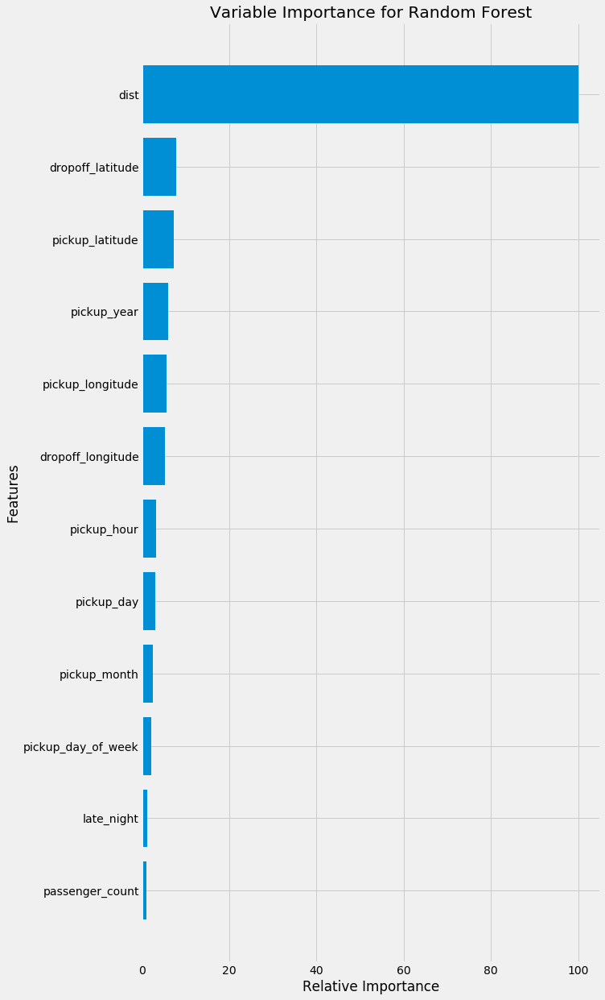

In [61]:
##Feature Importance of Random Forest
feature_importance = rf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
plt.figure(figsize=(20,20))
plt.subplot(1, 2, 2)
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X_train.columns[sorted_idx]) 
plt.xlabel('Relative Importance')
plt.ylabel('Features')
plt.title('Variable Importance for Random Forest')
plt.show()

In [62]:
#Find the fare_amount of test data
#Predicting test set with Random Forest

In [63]:
Final_pred= rf.predict(fare_test)

In [64]:
fare_test['fare_amount']=Final_pred

In [65]:
#Writing the predicted data to a csv file
fare_test.to_csv('Cabfare_PredictionPython.csv', index = False)